# Hello fellow Kagglers,

This notebook demonstrates the processing of the huge 300GB+ dataset of this competition into TFRecords for fast dataloading during training.

TFRecords have the benefit of loading large chunks of data containing many samples instead of loading every image and label seperately.

All images are resized to 1024x1024 and saved in 100 TFRecords, making each TFRecord contain roughly 550 images.

[RSNA EfficientNetV2 Training Tensorflow TPU](https://www.kaggle.com/code/markwijkhuizen/rsna-efficientnetv2-training-tensorflow-tpu)

**V2**

* 640x512 -> 1024x1024 resolution
* Cropping images
* Single image approach, not both CC and MLO image

Inference notebook in the making

**V3**

* 1024x1024 -> 768x1344 based on cropped image ratio
* using PNG encoded images instead of raw tensors to reduce disk space needed

**V5**

This will be the final update of my notebooks for this competitions, which should achieve a LB score in the low 0.50s. I will continue participating in this competition, however, I will not share my progress anymore to keep this competition competitive.

Updates in this version:

* Correct linear/sigmoid normalization of images, many thanks to [
Bob de Graaf
](https://www.kaggle.com/bobdegraaf) which shared this amazing notebook: [DicomSDL & VOI-LUT](https://www.kaggle.com/code/bobdegraaf/dicomsdl-voi-lut)
* Switching from PNG to JPEG with 95 compression level to stay within 20GB diskspace
* Adapted cropping algorithm to searches from maxima to threshold instead of edge to threshold (see Example Processing)
* Padding cropping offsets to image dimensions to keep image information instead of zero padding (see Example Processing)
* Actually using discomsdl instead of just installing it...

Good luck to all of you in the last month of this excisting competition!

In [1]:
%%capture
# Source: https://www.kaggle.com/code/remekkinas/fast-dicom-processing-1-6-2x-faster?scriptVersionId=113360473
!pip install /kaggle/input/rsnamodules/dicomsdl-0.109.1-cp37-cp37m-manylinux_2_12_x86_64.manylinux2010_x86_64.whl 

try:
    import pylibjpeg
except:
   !pip install /kaggle/input/rsna-2022-whl/{pylibjpeg-1.4.0-py3-none-any.whl,python_gdcm-3.0.15-cp37-cp37m-manylinux_2_17_x86_64.manylinux2014_x86_64.whl}

In [2]:
import numpy as np
import pandas as pd
import pylibjpeg
import pydicom
import matplotlib as mpl
import matplotlib.pyplot as plt
import tensorflow as tf

from joblib import Parallel, delayed
from tqdm.notebook import tqdm
from multiprocessing import cpu_count

import cv2
import glob
import importlib
import os
import joblib
import sys
import dicomsdl

print(f'Tensorflow Version: {tf.__version__}')
print(f'Python Version: {sys.version}')

# Tensorflow and CV2 set number of threads to 1 for speedup in parallell function mapping
tf.config.threading.set_inter_op_parallelism_threads(num_threads=1)
cv2.setNumThreads(1)

Tensorflow Version: 2.6.4
Python Version: 3.7.12 | packaged by conda-forge | (default, Oct 26 2021, 06:08:53) 
[GCC 9.4.0]


# Config

In [3]:
# Interactive flag for debugging purposes
IS_INTERACTIVE = os.environ['KAGGLE_KERNEL_RUN_TYPE'] == 'Interactive'

# Dimensions of processed images
TARGET_HEIGHT = 1152
TARGET_WIDTH = 1152
N_CHANNELS = 1
TARGET_HEIGHT_WIDTH_RATIO = 1

# Image Normalization Tools, did not improve LB score
# For a tutorial see: https://docs.opencv.org/4.x/d5/daf/tutorial_py_histogram_equalization.html
CLAHE = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(32, 32))
APPLY_CLAHE = False
APPLY_EQ_HIST = False

# Image Format and Config
IMAGE_FORMAT = 'JPG'
IMAGE_QUALITY = 95

# Random Generators Seed
SEED = 42

# Matplotlib Config

In [4]:
# MatplotLib Global Settings
mpl.rcParams.update(mpl.rcParamsDefault)
mpl.rcParams['xtick.labelsize'] = 16
mpl.rcParams['ytick.labelsize'] = 16
mpl.rcParams['axes.labelsize'] = 18
mpl.rcParams['axes.titlesize'] = 24

# Train

In [5]:
if IS_INTERACTIVE:
    train = pd.read_csv('/kaggle/input/rsna-breast-cancer-detection/train.csv').head(1024)
else:
    train = pd.read_csv('/kaggle/input/rsna-breast-cancer-detection/train.csv')
    
def get_file_path(args):
    patient_id, image_id = args
    return f'/kaggle/input/rsna-breast-cancer-detection/train_images/{patient_id}/{image_id}.dcm'

train['file_path'] = train[['patient_id', 'image_id']].apply(get_file_path, axis=1)
    
display(train.info())
display(train.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54705 entries, 0 to 54704
Data columns (total 15 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   site_id                  54705 non-null  int64  
 1   patient_id               54705 non-null  int64  
 2   image_id                 54705 non-null  int64  
 3   laterality               54705 non-null  object 
 4   view                     54705 non-null  object 
 5   age                      54668 non-null  float64
 6   cancer                   54705 non-null  int64  
 7   biopsy                   54705 non-null  int64  
 8   invasive                 54705 non-null  int64  
 9   BIRADS                   26285 non-null  float64
 10  implant                  54705 non-null  int64  
 11  density                  29469 non-null  object 
 12  machine_id               54705 non-null  int64  
 13  difficult_negative_case  54705 non-null  bool   
 14  file_path             

None

,site_id,patient_id,image_id,laterality,view,age,cancer,biopsy,invasive,BIRADS,implant,density,machine_id,difficult_negative_case,file_path
0,2,10006,462822612,L,CC,61.0,0,0,0,NaN,0,NaN,29,False,/kaggle/input/rsna-breast-cancer-detection/tra...
1,2,10006,1459541791,L,MLO,61.0,0,0,0,NaN,0,NaN,29,False,/kaggle/input/rsna-breast-cancer-detection/tra...
2,2,10006,1864590858,R,MLO,61.0,0,0,0,NaN,0,NaN,29,False,/kaggle/input/rsna-breast-cancer-detection/tra...
3,2,10006,1874946579,R,CC,61.0,0,0,0,NaN,0,NaN,29,False,/kaggle/input/rsna-breast-cancer-detection/tra...
4,2,10011,220375232,L,CC,55.0,0,0,0,0.0,0,NaN,21,True,/kaggle/input/rsna-breast-cancer-detection/tra...


# VOI_LUT

# Utility

In [6]:
import glob
filelist1 = glob.glob('/kaggle/input/dataset-1152-final-part1/pngs/*.png')
filelist2 = glob.glob('/kaggle/input/dataset-1152-final-part2/pngs/*.png')

In [7]:
# filelist1

In [8]:
filelist1png = [xx.split('/')[-1] for xx in filelist1]
filelist2png = [xx.split('/')[-1] for xx in filelist2]

In [9]:
len(filelist1png+filelist2png)

54705

In [10]:
# based on: https://www.kaggle.com/code/remekkinas/fast-dicom-processing-1-6-2x-faster?scriptVersionId=113360473
def process(file_path, size=(TARGET_WIDTH, TARGET_HEIGHT), dicom_process=True, ret_target=False, crop_image=False, apply_clahe=APPLY_CLAHE, apply_eq_hist=APPLY_EQ_HIST, debug=False):
    # Read Dicom File
    patient_id = int(file_path.split('/')[-2])
    image_id = int(file_path.split('/')[-1].split('.')[0])
    filename = f'{patient_id}_{image_id}.png'
    if filename in filelist1png:
        image = cv2.imread(f'/kaggle/input/dataset-1152-final-part1/pngs/{filename}', cv2.IMREAD_GRAYSCALE)
    if filename in filelist2png:
        image = cv2.imread(f'/kaggle/input/dataset-1152-final-part2/pngs/{filename}', cv2.IMREAD_GRAYSCALE)
    
    if debug:
        fig, axes = plt.subplots(1, 1, figsize=(5,5))
        axes.imshow(image)
        axes.set_title('Processed Image')
        axes.axis('off')
        plt.show()
        
    # Return Cancer Target
    if ret_target:
        patient_id = int(file_path.split('/')[-2])
        image_id = int(file_path.split('/')[-1].split('.')[0])

        target = PATIENT_ID_IMAGE_ID2CANCER[(patient_id, image_id)]
        
        return image, target
    else:
        return image

# Example Processing

In [11]:
train

,site_id,patient_id,image_id,laterality,view,age,cancer,biopsy,invasive,BIRADS,implant,density,machine_id,difficult_negative_case,file_path
0,2,10006,462822612,L,CC,61.0,0,0,0,NaN,0,NaN,29,False,/kaggle/input/rsna-breast-cancer-detection/tra...
1,2,10006,1459541791,L,MLO,61.0,0,0,0,NaN,0,NaN,29,False,/kaggle/input/rsna-breast-cancer-detection/tra...
2,2,10006,1864590858,R,MLO,61.0,0,0,0,NaN,0,NaN,29,False,/kaggle/input/rsna-breast-cancer-detection/tra...
3,2,10006,1874946579,R,CC,61.0,0,0,0,NaN,0,NaN,29,False,/kaggle/input/rsna-breast-cancer-detection/tra...
4,2,10011,220375232,L,CC,55.0,0,0,0,0.0,0,NaN,21,True,/kaggle/input/rsna-breast-cancer-detection/tra...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54700,1,9973,1729524723,R,MLO,43.0,0,0,0,1.0,0,C,49,False,/kaggle/input/rsna-breast-cancer-detection/tra...
54701,1,9989,63473691,L,MLO,60.0,0,0,0,NaN,0,C,216,False,/kaggle/input/rsna-breast-cancer-detection/tra...
54702,1,9989,1078943060,L,CC,60.0,0,0,0,NaN,0,C,216,False,/kaggle/input/rsna-breast-cancer-detection/tra...
54703,1,9989,398038886,R,MLO,60.0,0,0,0,0.0,0,C,216,True,/kaggle/input/rsna-breast-cancer-detection/tra...


  0%|          | 0/10 [00:00<?, ?it/s]

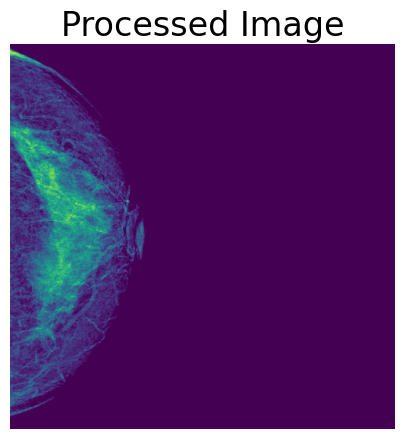

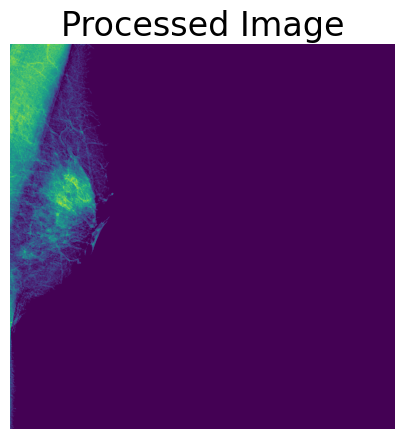

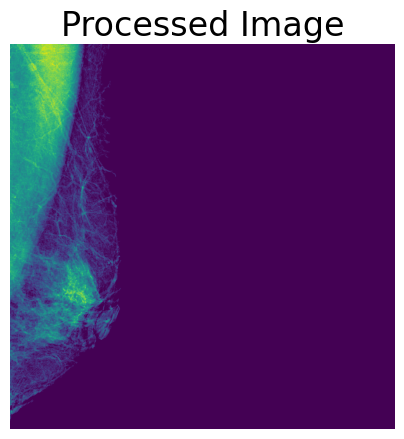

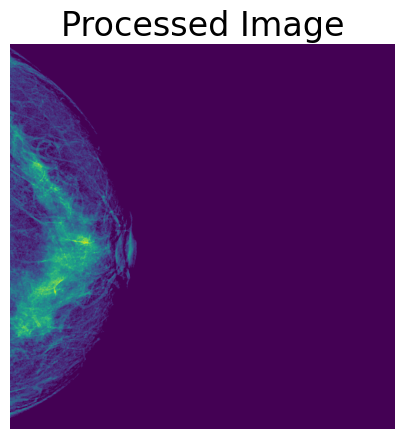

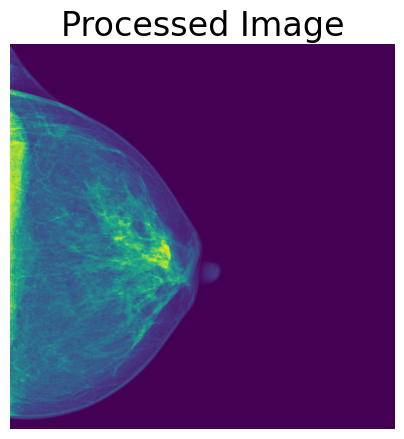

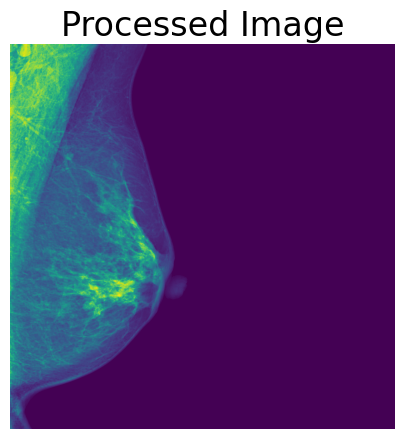

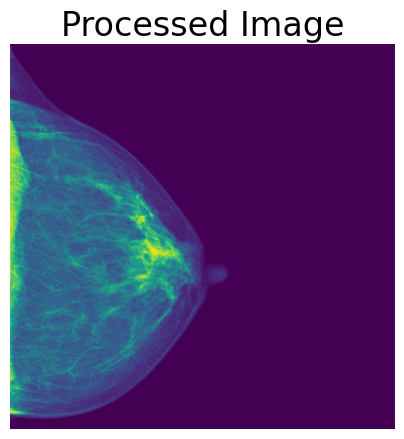

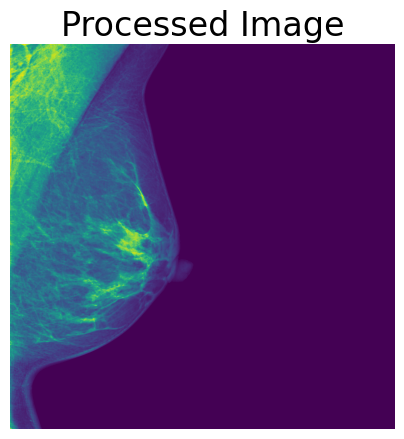

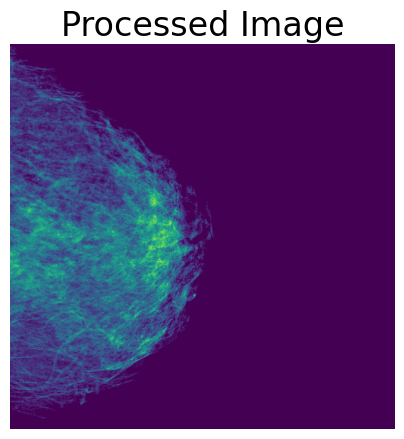

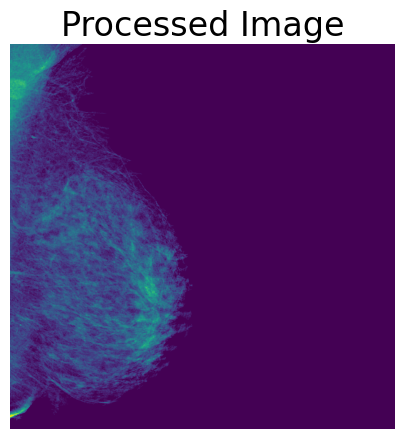

In [12]:
N = 4 if IS_INTERACTIVE else 10
for fp in tqdm(train['file_path'].head(N)):
    process(
            fp,
            crop_image=True,
            size=(TARGET_WIDTH, TARGET_HEIGHT),
            debug=True,
        )

# Example Processed Images

  0%|          | 0/32 [00:00<?, ?it/s]

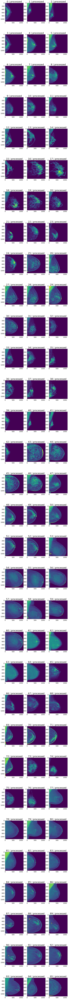

In [13]:
def plot_original_processed_examples(rows=3, cols=3):
    fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, 6 * rows))
    for r in tqdm(range(rows)):
        for c in range(cols):
            idx = (r * cols) + c
            image = process(
                    train.loc[idx, 'file_path'],
                    crop_image=True,
                    size=(TARGET_WIDTH, TARGET_HEIGHT),
                    apply_clahe=APPLY_CLAHE,
                    apply_eq_hist=APPLY_EQ_HIST,
                    debug=False,
                )
            axes[r, c].imshow(image)
            axes[r, c].set_title(f'{idx} | processed')

    plt.show()
    
plot_original_processed_examples(rows=3 if IS_INTERACTIVE else 32)

# Train

In [14]:
# Check if all patients have both CC and MLO view
if not IS_INTERACTIVE:
    for g_idx, g in tqdm(train.groupby('patient_id')):
        if 'CC' not in g['view'].values or 'MLO' not in g['view'].values:
            display(g)

  0%|          | 0/11913 [00:00<?, ?it/s]

In [15]:
# Maps a patient_id and image_id to cancer target
PATIENT_ID_IMAGE_ID2CANCER = train.set_index(['patient_id', 'image_id'])['cancer'].to_dict()

# Test

In [16]:
# Example Test data
test = pd.read_csv('/kaggle/input/rsna-breast-cancer-detection/test.csv')

display(test.info())
display(test.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4 entries, 0 to 3
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   site_id        4 non-null      int64 
 1   patient_id     4 non-null      int64 
 2   image_id       4 non-null      int64 
 3   laterality     4 non-null      object
 4   view           4 non-null      object
 5   age            4 non-null      int64 
 6   implant        4 non-null      int64 
 7   machine_id     4 non-null      int64 
 8   prediction_id  4 non-null      object
dtypes: int64(6), object(3)
memory usage: 416.0+ bytes


None

,site_id,patient_id,image_id,laterality,view,age,implant,machine_id,prediction_id
0,2,10008,736471439,L,MLO,81,0,21,10008_L
1,2,10008,1591370361,L,CC,81,0,21,10008_L
2,2,10008,68070693,R,MLO,81,0,21,10008_R
3,2,10008,361203119,R,CC,81,0,21,10008_R


# Sample Submission

In [17]:
# Example submission
sample_submission = pd.read_csv('/kaggle/input/rsna-breast-cancer-detection/sample_submission.csv')

display(sample_submission.info())
display(sample_submission.head())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2 entries, 0 to 1
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   prediction_id  2 non-null      object 
 1   cancer         2 non-null      float64
dtypes: float64(1), object(1)
memory usage: 160.0+ bytes


None

,prediction_id,cancer
0,10008_L,0.021168
1,10008_R,0.021168


# Train Meta Data

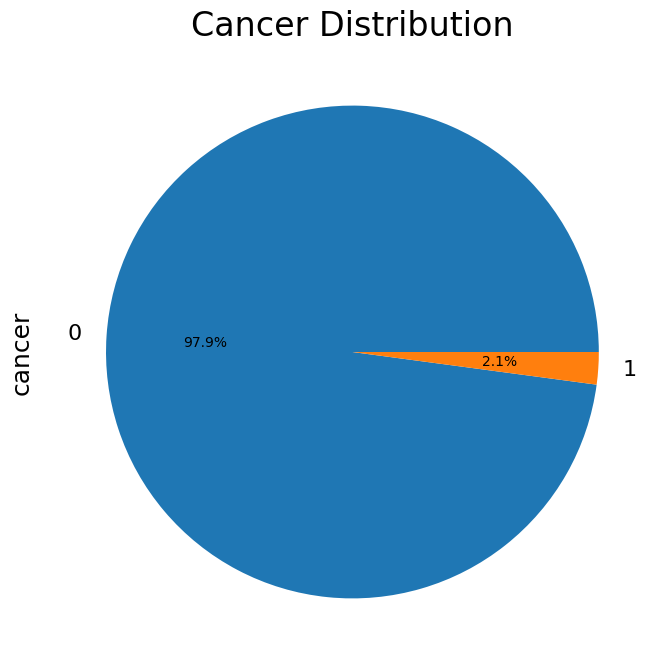

In [18]:
# Train data is imbalanced, we have ~50x more negative samples than positive samples
plt.figure(figsize=(8, 8))
train['cancer'].value_counts().plot(kind='pie', autopct='%1.1f%%', title='Cancer Distribution')
plt.show()

# Image Statistics

In [19]:
# Patient folder paths
FOLDER_PATHS = filelist1+filelist2
print(f'Found {len(FOLDER_PATHS)} Train Folders')

Found 54705 Train Folders


In [20]:
# File paths
FILE_PATHS = glob.glob('/kaggle/input/rsna-breast-cancer-detection/train_images/*/*.dcm')
print(f'Found {len(FILE_PATHS)} Train Files')

Found 54706 Train Files


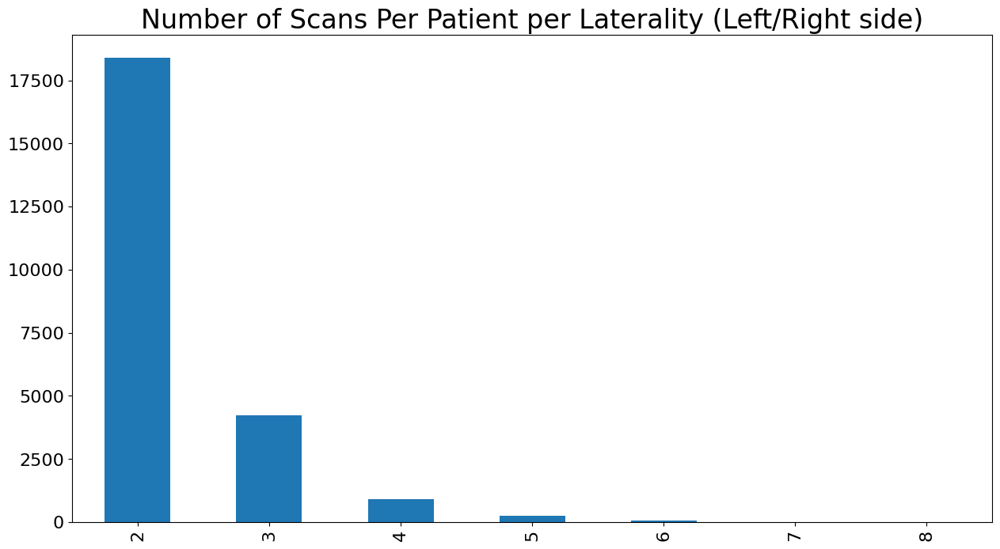

In [21]:
plt.figure(figsize=(15,8))
plt.title('Number of Scans Per Patient per Laterality (Left/Right side)')
train.groupby(['patient_id', 'laterality']).apply(len).value_counts().sort_index().plot(kind='bar')
plt.show()

In [22]:
# View Counts: AT/LM/ML/LMO are rare, too few samples to train on
display(train['view'].value_counts().to_frame('count'))

,count
MLO,27902
CC,26765
AT,19
LM,10
ML,8
LMO,1


In [23]:
# Scan View Counts: most patient only have a CC and MLO scan
display(train.sort_values('view').groupby(['patient_id', 'laterality'])['view'].apply(tuple).value_counts().to_frame('Count'))

,Count
"(CC, MLO)",18384
"(CC, MLO, MLO)",2599
"(CC, CC, MLO)",1605
"(CC, CC, MLO, MLO)",795
"(CC, CC, MLO, MLO, MLO)",161
"(CC, CC, CC, MLO, MLO)",71
"(CC, MLO, MLO, MLO)",60
"(CC, CC, CC, MLO, MLO, MLO)",46
"(CC, CC, CC, MLO)",44
"(AT, CC, MLO)",10


# Image Dimensions

In [24]:
np.random.seed(42)

# Get height/width statistics
N = int(16 if IS_INTERACTIVE else 1024)
WIDTHS = []
HEIGHTS = []
for fp in tqdm(np.random.choice(FILE_PATHS, N)):
    h, w = process(fp).shape
    HEIGHTS.append(h)
    WIDTHS.append(w)

  0%|          | 0/1024 [00:00<?, ?it/s]

In [25]:
# patient_id = int(fp.split('/')[-2])
# image_id = int(fp.split('/')[-1].split('.')[0])
# filenew = f'/kaggle/input/rsna-1024x1024-pngs-small/pngs/{patient_id}_{image_id}.png'
# print(filenew)
# image = cv2.imread(filenew, cv2.IMREAD_GRAYSCALE)
# # image = cv2.resize(image, (TARGET_WIDTH, TARGET_HEIGHT), interpolation=cv2.INTER_AREA)
# plt.imshow(image)
# plt.show()

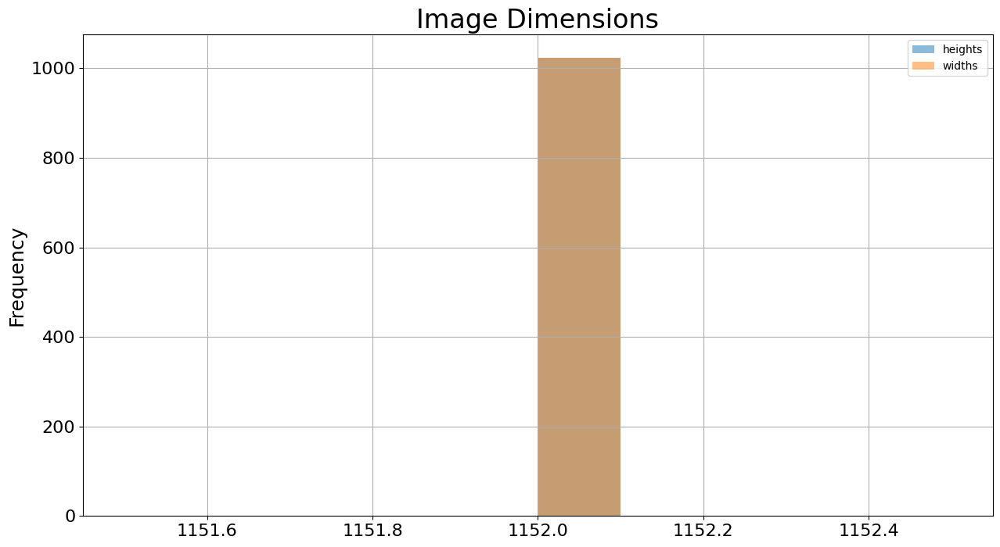

In [26]:
# Patches are insanely huge!
plt.figure(figsize=(15,8))
plt.title('Image Dimensions', size=24)
pd.Series(HEIGHTS).plot(kind='hist', alpha=0.50, label='heights')
pd.Series(WIDTHS).plot(kind='hist', alpha=0.50, label='widths')
plt.grid()
plt.legend()
plt.show()

,Height/Width Ratio's
count,1024.0
mean,1.0
std,0.0
min,1.0
25%,1.0
50%,1.0
75%,1.0
max,1.0


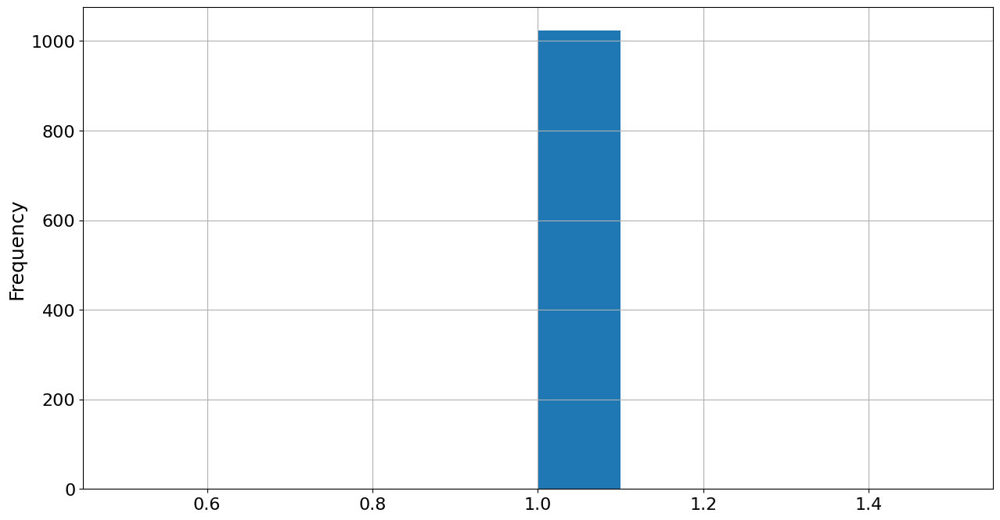

In [27]:
# Height to Width Ratio's, height is roughly 1.25x width, that's why resize to (512*1.25)x512 = 640x512
display(pd.Series(np.array(HEIGHTS) / np.array(WIDTHS)).describe().to_frame('Height/Width Ratio\'s'))

plt.figure(figsize=(15,8))
pd.Series(np.array(HEIGHTS) / np.array(WIDTHS)).plot(kind='hist')
plt.grid()
plt.show()

# Cropped Image Dimensions

In [28]:
np.random.seed(SEED)

N = int(16 if IS_INTERACTIVE else 1024)
WIDTHS_CROPPED = []
HEIGHTS_CROPPED = []

for fp in tqdm(np.random.choice(FILE_PATHS, N)):
    h, w = process(fp, crop_image=True).shape
    WIDTHS_CROPPED.append(h)
    HEIGHTS_CROPPED.append(w)

  0%|          | 0/1024 [00:00<?, ?it/s]

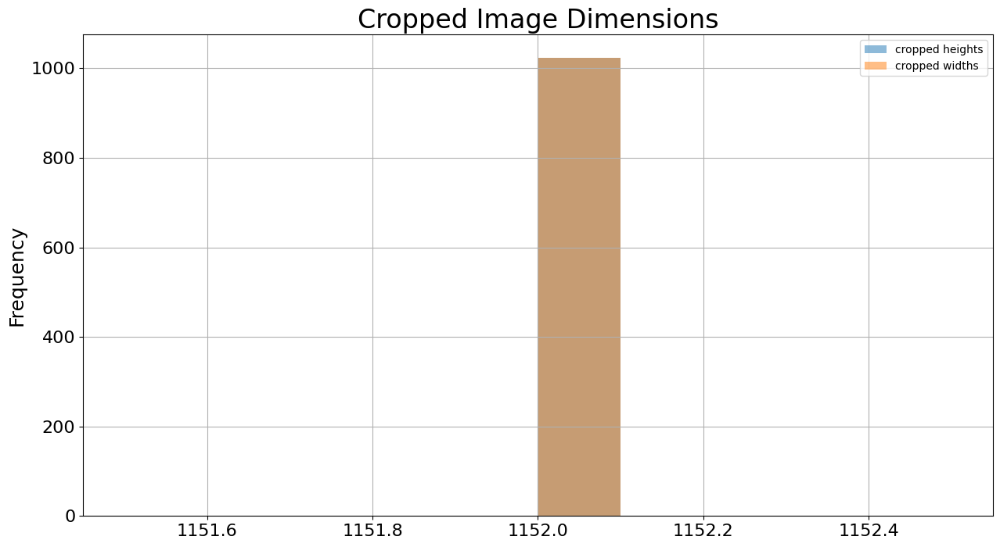

In [29]:
plt.figure(figsize=(15,8))
plt.title('Cropped Image Dimensions', size=24)
pd.Series(WIDTHS_CROPPED).plot(kind='hist', alpha=0.50, label='cropped heights')
pd.Series(HEIGHTS_CROPPED).plot(kind='hist', alpha=0.50, label='cropped widths')
plt.grid()
plt.legend()
plt.show()

,Cropped Height/Width Ratio's
count,1024.0
mean,1.0
std,0.0
min,1.0
25%,1.0
50%,1.0
75%,1.0
max,1.0


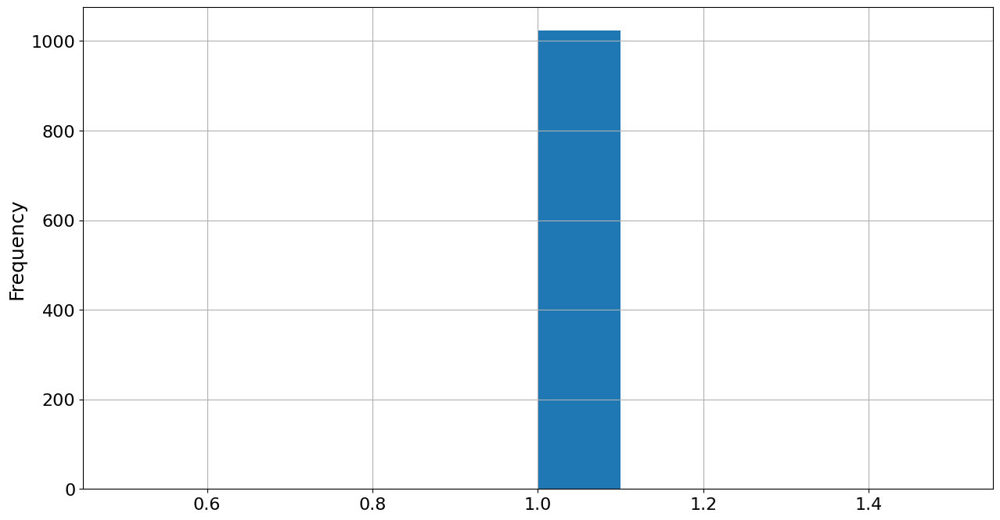

In [30]:
# Height to Width Ratio's
display(pd.Series(np.array(WIDTHS_CROPPED) / np.array(HEIGHTS_CROPPED)).describe().to_frame('Cropped Height/Width Ratio\'s'))
plt.figure(figsize=(15,8))
pd.Series(np.array(WIDTHS_CROPPED) / np.array(HEIGHTS_CROPPED)).plot(kind='hist')
plt.grid()
plt.show()

# Chunk Generation

In [31]:
# Make Pairs of Views as input to the model
FILE_PATHS_PAIRS = []
for row_idx, row in tqdm(train.iterrows(), total=len(train)):
        FILE_PATHS_PAIRS.append(row[['patient_id', 'image_id']].values)
        
FILE_PATHS_PAIRS = np.array(FILE_PATHS_PAIRS, dtype=object)
print(f'FILE_PATHS_PAIRS shape: {FILE_PATHS_PAIRS.shape}')

  0%|          | 0/54705 [00:00<?, ?it/s]

FILE_PATHS_PAIRS shape: (54705, 2)


In [32]:
# Put every image in a seperate TFRecord file
N_CHUNKS = 100
CHUNKS = np.array_split(FILE_PATHS_PAIRS, N_CHUNKS)

print(f'N_CHUNKS: {N_CHUNKS}, CHUNK len: {len(CHUNKS[0])}, shape: {CHUNKS[0].shape}')

N_CHUNKS: 100, CHUNK len: 548, shape: (548, 2)


In [33]:
CHUNKS[0]

array([[10006, 462822612],
       [10006, 1459541791],
       [10006, 1864590858],
       ...,
       [10550, 1612042178],
       [10552, 55428248],
       [10552, 1781460887]], dtype=object)

In [34]:
# Single sample processing
def process_chunk(args):
    patient_id, image_id = args
    # Define file path
    fp = f'/kaggle/input/rsna-breast-cancer-detection/train_images/{patient_id}/{image_id}.dcm'
    # Get processed image and target
    image, target = process(fp, size=(TARGET_WIDTH, TARGET_HEIGHT), ret_target=True, crop_image=True)

    # Make grayscale channel
    image = np.expand_dims(image, 2)
    
    # Encode PNG
    if IMAGE_FORMAT == 'PNG':
        image_serialized = tf.io.encode_png(image, compression=-1).numpy()
    # Encode JPEG
    else:
        image_serialized = tf.io.encode_jpeg(image, quality=IMAGE_QUALITY, optimize_size=True).numpy()
    
    return image_serialized, target, patient_id, image_id

In [35]:
# tf.io.encode_png?

In [36]:
def to_tf_records(chunks):
    for chunk_idx, chunk in enumerate(tqdm(chunks)):
        print(f'===== GENERATING TFRECORDS {chunk_idx} =====')
        chunk_idx = chunk_idx
        tfrecord_name = f'batch_{chunk_idx}.tfrecords'
        
        # Create the actual TFRecords
        options = tf.io.TFRecordOptions(compression_type='GZIP', compression_level=9)
        cnt = 0
        with tf.io.TFRecordWriter(tfrecord_name, options=options) as file_writer:
            # Process Samples in Chunk in Parallell
            jobs = [joblib.delayed(process_chunk)(args) for args in chunk]
            chunk_processed = joblib.Parallel(
                n_jobs=cpu_count(),
                verbose=0,
                backend='multiprocessing',
                prefer='threads',
            )(jobs)
            
            # Add Processed Samples to TFRecord
            for image, target, patient_id, image_id in chunk_processed:
                record_bytes = tf.train.Example(features=tf.train.Features(feature={
                    # Image
                    'image': tf.train.Feature(bytes_list=tf.train.BytesList(value=[image])),

                    # target
                    'target': tf.train.Feature(int64_list=tf.train.Int64List(value=[target])),
                    
                    # patient_id
                    'patient_id': tf.train.Feature(int64_list=tf.train.Int64List(value=[patient_id])),
                    
                    # image_id
                    'image_id': tf.train.Feature(int64_list=tf.train.Int64List(value=[image_id])),
                })).SerializeToString()
                file_writer.write(record_bytes)
                cnt+=1
        print('write pngs:',(cnt))
            
# Create TFRecords
if IS_INTERACTIVE:
    to_tf_records(CHUNKS[:2])
else:
    to_tf_records(CHUNKS)

  0%|          | 0/100 [00:00<?, ?it/s]

===== GENERATING TFRECORDS 0 =====
write pngs: 548
===== GENERATING TFRECORDS 1 =====
write pngs: 548
===== GENERATING TFRECORDS 2 =====
write pngs: 548
===== GENERATING TFRECORDS 3 =====
write pngs: 548
===== GENERATING TFRECORDS 4 =====
write pngs: 548
===== GENERATING TFRECORDS 5 =====
write pngs: 547
===== GENERATING TFRECORDS 6 =====
write pngs: 547
===== GENERATING TFRECORDS 7 =====
write pngs: 547
===== GENERATING TFRECORDS 8 =====
write pngs: 547
===== GENERATING TFRECORDS 9 =====
write pngs: 547
===== GENERATING TFRECORDS 10 =====
write pngs: 547
===== GENERATING TFRECORDS 11 =====
write pngs: 547
===== GENERATING TFRECORDS 12 =====
write pngs: 547
===== GENERATING TFRECORDS 13 =====
write pngs: 547
===== GENERATING TFRECORDS 14 =====
write pngs: 547
===== GENERATING TFRECORDS 15 =====
write pngs: 547
===== GENERATING TFRECORDS 16 =====
write pngs: 547
===== GENERATING TFRECORDS 17 =====
write pngs: 547
===== GENERATING TFRECORDS 18 =====
write pngs: 547
===== GENERATING TFREC

# Check TFRecords

In [37]:
N = 16 if IS_INTERACTIVE else 32

In [38]:
# Function to decode the TFRecords
def decode_tfrecord(record_bytes):
    features = tf.io.parse_single_example(record_bytes, {
        'image': tf.io.FixedLenFeature([], tf.string),
        'target': tf.io.FixedLenFeature([], tf.int64),
        'patient_id': tf.io.FixedLenFeature([], tf.int64),
        'image_id': tf.io.FixedLenFeature([], tf.int64),
    })
        
    if IMAGE_FORMAT == 'PNG':
        image = tf.io.decode_png(features['image'], channels=N_CHANNELS)
    else:
        image = tf.io.decode_jpeg(features['image'], channels=N_CHANNELS)
        
    image = tf.reshape(image, [TARGET_HEIGHT, TARGET_WIDTH, N_CHANNELS])

    target = features['target']
    patient_id = features['patient_id']
    image_id = features['image_id']
    
    return image, target, patient_id, image_id

More on Tensorflow TFRecord Datasets: [TFRecordDataset](https://www.tensorflow.org/api_docs/python/tf/data/TFRecordDataset)

In [39]:
# Sample TFRecord Dataset
def get_train_dataset():
    # Read all TFRecord file paths
    FNAMES_TRAIN_TFRECORDS = tf.io.gfile.glob('./*.tfrecords')
    # initialize TFRecord dataset
    train_dataset = tf.data.TFRecordDataset(FNAMES_TRAIN_TFRECORDS, num_parallel_reads=1, compression_type='GZIP')
    # Decode samples by mapping with decode function
    train_dataset = train_dataset.map(decode_tfrecord)
    # Batch samples
    train_dataset = train_dataset.batch(N)
    
    return train_dataset

In [40]:
# Shows a batch of images
def show_batch(dataset, rows=N, cols=1):
    images, targets, patient_ids, image_ids = next(iter(dataset))
    images = np.moveaxis(images, 3, 1)
    fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(cols*6, rows*10))
    for r in range(rows):
        for c in range(cols):
            img = images[r,c]
            axes[r].imshow(img)
            if c == 0:
                target = targets[r]
                patient_id = patient_ids[r]
                image_id = image_ids[r]
                axes[r].set_title(f'target: {target}, patient_id: {patient_id}, image_id: {image_id}', fontsize=12, pad=16)
        
    plt.show()

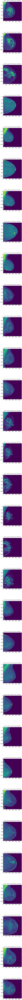

In [41]:
# Show Example Batch
train_dataset = get_train_dataset()
show_batch(train_dataset)

In [42]:
# ##计算所有图片个数
# c = []
# for record in train_dataset:
#     c += record[2].numpy().tolist()
# len(c)